# Data Cleaning & Wrangling (ETL Cont.)
This file cleans the dataset that we scraped. I went to excel and converted the nongated and subvision to 0s and gated to 1s. This was done with a simple IF formula.

The data cleaning process took the longest time because of the amount of information collected. The purpose of the data cleaning and wrangling step is to prepare for our models.

In [1]:
# Import necessary libraries

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from pandas.plotting import scatter_matrix
import matplotlib.ticker as mtick
import plotly.express as px

from sklearn.preprocessing import MultiLabelBinarizer
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import branca.colormap as cm


In [3]:
# Pretty sure I renamed it or smth
file = "SWFL_Data.csv"
df = pd.read_csv(file)
df.head()

,id,price,address,beds,baths,sqft,year_built,link,description,agent_info,...,Living_Area,Total_Area,Garage Spaces,Floor Description,Interior Features,Rear Exposure,Taxes,Tax Year,Total Floors,Zip Code
0,3587,"$210,000,000","100 Bay Rd, Naples, FL 34102",NaN,13.0,17106.0,1989.0,https://www.realtyofnaples.com/mls225006043.html,"There is nothing like it, anywhere. Gordon Poi...","Alena Vydra, PA",...,NaN,22800,6.0,"Concrete, Tile","Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",W,"$861,709",2024.0,2.0,34102
1,3622,"$175,000,000","2200 Gordon Dr, Naples, FL 34102",NaN,13.0,8846.0,1986.0,https://www.realtyofnaples.com/mls223017155.html,This is the center parcel of one of the larges...,Oleg Mikhailov,...,NaN,11549,3.0,"Tile, Wood","Bar, Built-In Cabinets, Closet Cabinets, Coffe...",W,"$735,737",2022.0,1.0,34102
2,3079,"$89,000,000","20 14th Ave S, Naples, FL 34102",0.0,NaN,4822.0,1962.0,https://www.realtyofnaples.com/mls224076721.html,You’ve earned it. Now enjoy it in paradise. Si...,"Alena Vydra, PA",...,NaN,7897,NaN,NaN,Other,W,"$53,231",2023.0,1.0,34102
3,3080,"$77,000,000","25 16th Ave S, Naples, FL 34102",NaN,5.0,11279.0,2014.0,https://www.realtyofnaples.com/mls225002927.html,Magnificent beachfront estate property in one ...,"Alena Vydra, PA",...,NaN,24809,3.0,"Carpet, Tile, Wood","Built-In Cabinets, Fireplace, Foyer, Wet Bar",W,"$406,749",2024.0,2.0,34102
4,3623,"$60,000,000","2170 Gordon Dr, Naples, FL 34102",0.0,2.0,3518.0,1996.0,https://www.realtyofnaples.com/mls223017618.html,This is the northernmost parcel of one of the ...,Oleg Mikhailov,...,NaN,3518,5.0,"Concrete, Tile",Other,W,"$241,743",2022.0,1.0,34102


In [4]:
df.shape

(8429, 25)

Clean Data

**NOTE**: There are some plots of land that are being sold, hence are not reliable listings. I decided to create a scatterplot for price to see

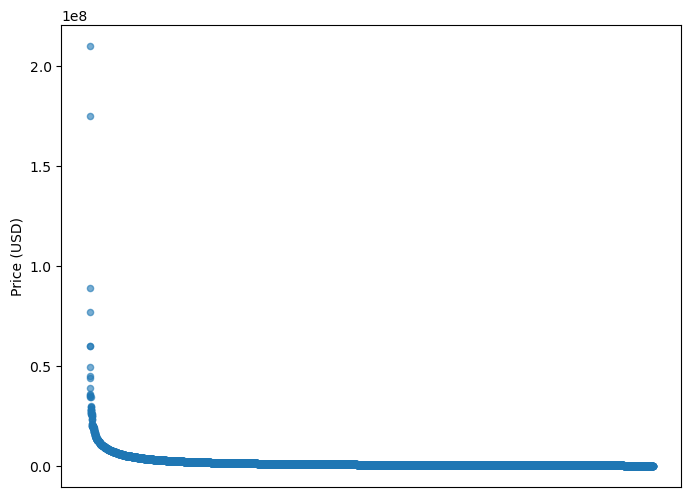

In [6]:
# Clean numeric prices
prices = (
    df['price']
      .astype(str)
      .str.replace(r'[\$,]', '', regex=True)
      .astype(float)
)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(prices.index, prices, s=20, alpha=0.6)
plt.ylabel('Price (USD)')
plt.xticks([])   # Hide x-axis ticks
plt.show()


Not a great plot so I will continue to explore

# Relationship Plots
Let's find any relationships with our variables

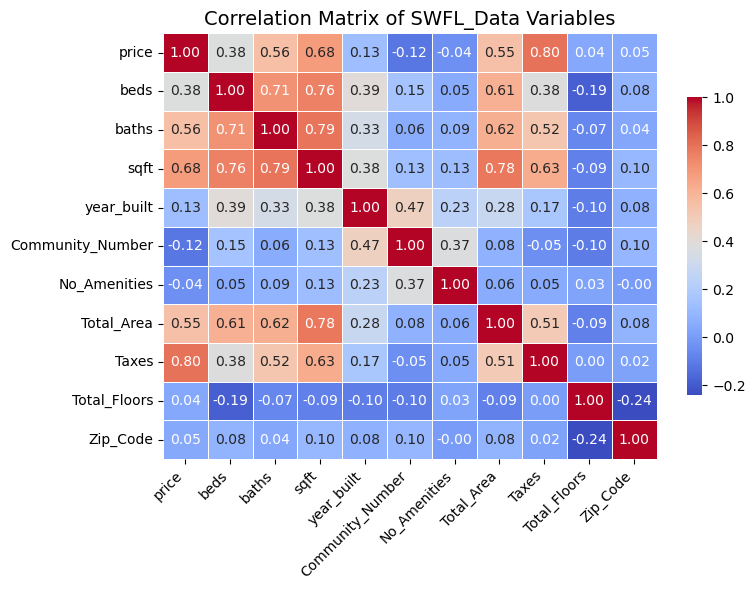

<Figure size 1200x1200 with 0 Axes>

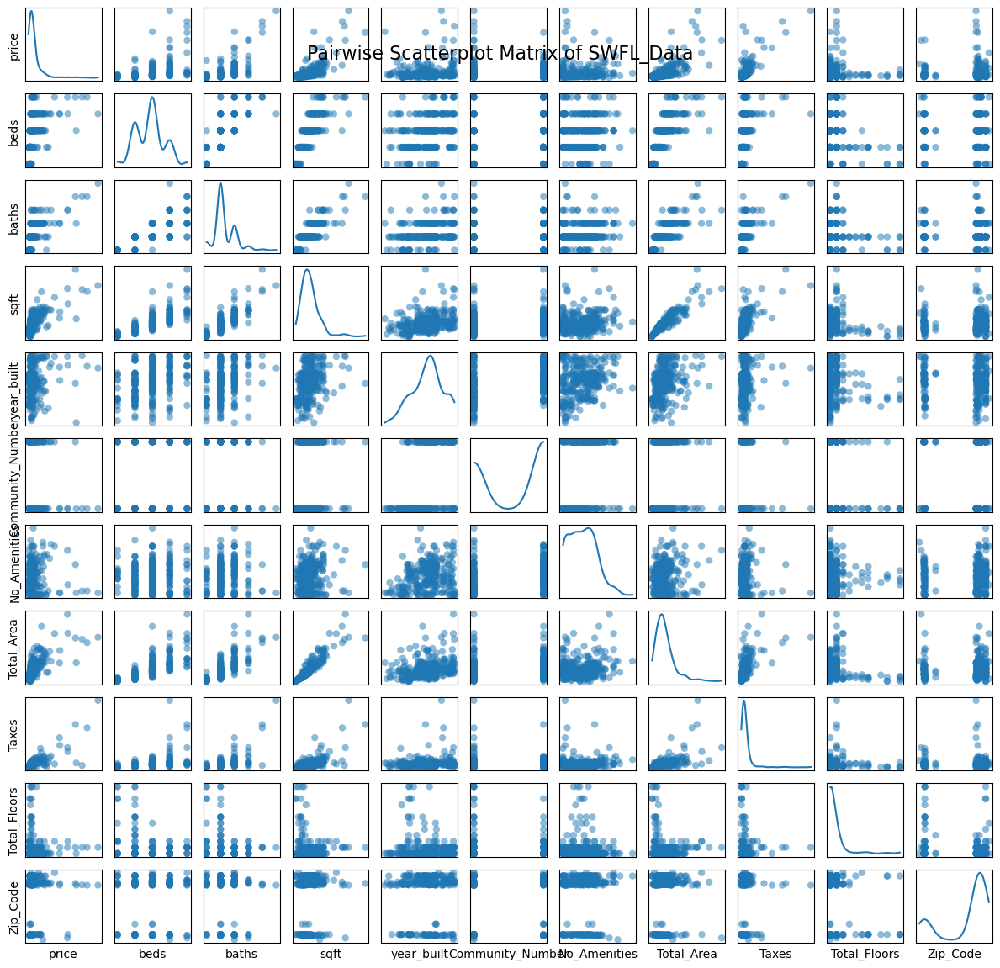

In [10]:


# 1) Clean & convert relevant columns to numeric ---
df['price']            = pd.to_numeric(df['price'].astype(str)
                                           .str.replace(r'[\$,]', '', regex=True),
                                        errors='coerce')
df['beds']             = pd.to_numeric(df['beds'], errors='coerce')
df['baths']            = pd.to_numeric(df['baths'], errors='coerce')
df['sqft']             = pd.to_numeric(df['sqft'], errors='coerce')
df['year_built']       = pd.to_numeric(df['year_built'], errors='coerce')
df['Community_Number'] = pd.to_numeric(df['Community_Number'], errors='coerce')
df['No_Amenities']     = pd.to_numeric(df['No_Ammenities'], errors='coerce')
df['Total_Area']       = pd.to_numeric(df['Total_Area'], errors='coerce')
df['Taxes']            = pd.to_numeric(df['Taxes'].astype(str)
                                           .str.replace(r'[\$,]', '', regex=True),
                                        errors='coerce')
df['Total_Floors']     = pd.to_numeric(df['Total Floors'], errors='coerce')
df['Zip_Code']         = pd.to_numeric(df['Zip Code'], errors='coerce')

# 2) Select variables and drop missing values ---
vars_to_use = [
    'price', 'beds', 'baths', 'sqft', 'year_built',
    'Community_Number', 'No_Amenities', 'Total_Area',
    'Taxes', 'Total_Floors', 'Zip_Code'
]
data = df[vars_to_use].dropna()

# 3) Correlation Heatmap ---
plt.figure(figsize=(8, 6))
corr = data.corr()
sns.heatmap(
    corr, annot=True, fmt=".2f", cmap="coolwarm",
    linewidths=0.5, cbar_kws={'shrink':0.7}
)
plt.title("Correlation Matrix of SWFL_Data Variables", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# 4) Scatterplot Matrix (downsampled) ---
sample = data.sample(n=min(300, len(data)), random_state=42)

plt.figure(figsize=(12, 12))
axes = scatter_matrix(
    sample,
    alpha=0.5,
    diagonal='kde',
    figsize=(12, 12),
    grid=True,
    marker='o',
    hist_kwds={'bins':15},
    range_padding=0.1
)
# Remove ticks for clarity
for ax in axes.ravel():
    ax.set_xticks([])
    ax.set_yticks([])

plt.suptitle("Pairwise Scatterplot Matrix of SWFL_Data", fontsize=16, y=0.92)
plt.tight_layout()
plt.show()


# More Data Processing
Here the file I was able to download after running the zipcode python file is joined with our current cleaned dataset. It's important to join to create our map

In [11]:
# 1) Load the two datasets
listings = pd.read_csv('SWFL_Data.csv')
coords   = pd.read_csv('Final_SWFL_With_Fallback_Coords.csv')

# 2) Inspect columns to determine join keys
print("Listings columns:", listings.columns.tolist())
print("Coords columns:  ", coords.columns.tolist())

# 3) Merge on the address field
#    Assume 'address' in listings and 'original_address' in coords
df_merged = pd.merge(
    listings,
    coords,
    left_on='address',
    right_on='original_address',
    how='left',
    suffixes=('', '_coord')
)

# 4) Inspect the merged result
print("\nMerged DataFrame shape:", df_merged.shape)
print(df_merged.head())

# 5) Optionally, save the merged DataFrame
df_merged.to_csv('SWFL_Merged_With_Coords.csv', index=False)


Listings columns: ['id', 'price', 'address', 'beds', 'baths', 'sqft', 'year_built', 'link', 'description', 'agent_info', 'Community Name', 'Community Type', 'Community_Number', 'Amenities', 'No_Ammenities', 'Living_Area', 'Total_Area', 'Garage Spaces', 'Floor Description', 'Interior Features', 'Rear Exposure', 'Taxes', 'Tax Year', 'Total Floors', 'Zip Code']
Coords columns:   ['original_address', 'clean_address', 'latitude', 'longitude']

Merged DataFrame shape: (8571, 29)
     id          price                           address  beds  baths  \
0  3587  $210,000,000       100 Bay Rd, Naples, FL 34102   NaN   13.0   
1  3622  $175,000,000   2200 Gordon Dr, Naples, FL 34102   NaN   13.0   
2  3079   $89,000,000    20 14th Ave S, Naples, FL 34102   0.0    NaN   
3  3080   $77,000,000    25 16th Ave S, Naples, FL 34102   NaN    5.0   
4  3623   $60,000,000   2170 Gordon Dr, Naples, FL 34102   0.0    2.0   

      sqft  year_built                                              link  \
0  1710

# Interactive Geomap

In [12]:

# 1) Load & clean
df = pd.read_csv('SWFL_Merged_With_Coords.csv')\
       .rename(columns={'Zip Code':'Zip_Code'})
df['latitude']  = pd.to_numeric(df['latitude'],  errors='coerce')
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['price']     = pd.to_numeric(df['price'].astype(str)
                                   .str.replace(r'[\$,]', '', regex=True),
                                errors='coerce')
df = df.dropna(subset=['latitude','longitude','price'])

# 2) Map, colored & sized by price
fig = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    color="price",          # color‐scale now reflects price
    size="price",           # marker size reflects price too
    hover_name="address",
    hover_data=["Zip_Code","price"],
    color_continuous_scale="Viridis",
    size_max=12,
    zoom=9,
    height=600,
    title="SWFL Listings — Marker Color & Size by Price"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin=dict(r=0, t=40, l=0, b=0)
)
fig.show()


C:\Users\chris\AppData\Local\Temp\ipykernel_20392\3848190803.py:25: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



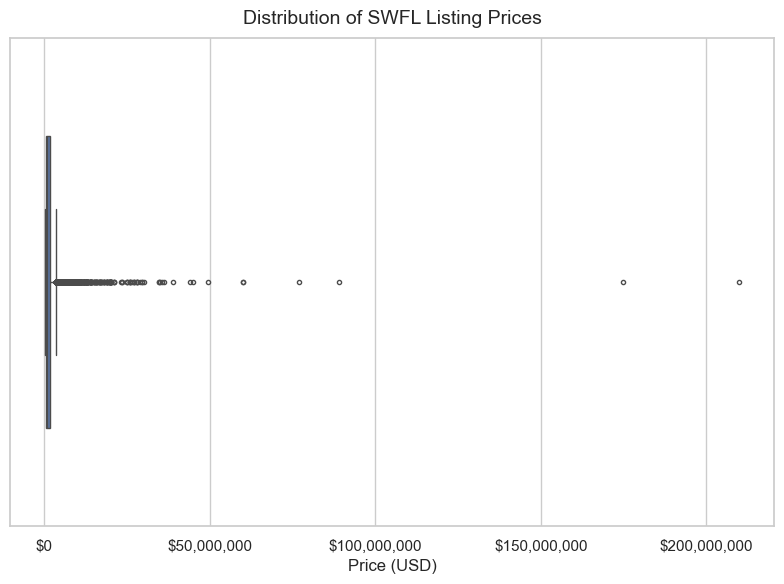

In [14]:

# Clean and convert price to numeric
df['price'] = (
    df['price']
      .astype(str)
      .str.replace(r'[\$,]', '', regex=True)
      .astype(float)
)
df = df.dropna(subset=['price'])

# --- 2) Create box plot of listing prices ---
plt.figure(figsize=(8, 6))
sns.set(style='whitegrid')

# Plot
ax = sns.boxplot(
    x=df['price'],
    color='#4C72B0',
    width=0.6,
    fliersize=3,
    orient='h'
)

# Labeling
ax.set_xlabel('Price (USD)', fontsize=12)
ax.set_yticklabels([''])
ax.set_title('Distribution of SWFL Listing Prices', fontsize=14, pad=10)

# Improve x-axis formatting: use thousands separators
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x:,.0f}"))

plt.tight_layout()
plt.show()


Boxplot shows there are a lot of outliers and probably some lands that are too cheap

There are definitely a lot of outliers present. 

In [16]:
# Helper to format numbers in accounting style
def fmt_currency(x):
    """Convert a number to accounting format with commas and two decimals."""
    try:
        v = float(x)
    except (TypeError, ValueError):
        return "N/A"
    if v < 0:
        return f"(${abs(v):,.2f})"
    return f"${v:,.2f}"

# 1) Load your data (adjust path if needed)
df = pd.read_csv('SWFL_Merged_With_Coords.csv')
# Clean the price column
df['price'] = (
    df['price'].astype(str)
       .str.replace(r'[\$,]', '', regex=True)
       .astype(float)
)
prices = df['price'].dropna()

# 2) Compute overall summary
summary = prices.describe()

# 3) Compute Q1, Q3, IQR
Q1 = prices.quantile(0.25)
Q3 = prices.quantile(0.75)
IQR = Q3 - Q1

# 4) Outlier bounds
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

# 5) Separate outliers
outliers     = prices[(prices < lower) | (prices > upper)]
non_outliers = prices[(prices >= lower) & (prices <= upper)]
summary_no   = non_outliers.describe()

# 6) Print formatted results
print("=== Overall Price Summary ===")
print(f"Count        : {int(summary['count'])}")
print(f"Mean         : {fmt_currency(summary['mean'])}")
print(f"Std Dev      : {fmt_currency(summary['std'])}")
print(f"Min          : {fmt_currency(summary['min'])}")
print(f"25% (Q1)     : {fmt_currency(Q1)}")
print(f"50% (Median) : {fmt_currency(summary['50%'])}")
print(f"75% (Q3)     : {fmt_currency(Q3)}")
print(f"Max          : {fmt_currency(summary['max'])}\n")

print("=== IQR & Outlier Bounds ===")
print(f"IQR            : {fmt_currency(IQR)}")
print(f"Lower bound    : {fmt_currency(lower)}")
print(f"Upper bound    : {fmt_currency(upper)}")
print(f"Outliers count : {outliers.count()} of {int(summary['count'])}\n")

print("=== Summary Without Outliers ===")
print(f"Count        : {int(summary_no['count'])}")
print(f"Mean         : {fmt_currency(summary_no['mean'])}")
print(f"Std Dev      : {fmt_currency(summary_no['std'])}")
print(f"Min          : {fmt_currency(summary_no['min'])}")
print(f"25% (Q1)     : {fmt_currency(summary_no['25%'])}")
print(f"50% (Median) : {fmt_currency(summary_no['50%'])}")
print(f"75% (Q3)     : {fmt_currency(summary_no['75%'])}")
print(f"Max          : {fmt_currency(summary_no['max'])}")

=== Overall Price Summary ===
Count        : 8571
Mean         : $1,829,381.58
Std Dev      : $4,429,544.49
Min          : $79,999.00
25% (Q1)     : $537,000.00
50% (Median) : $799,000.00
75% (Q3)     : $1,650,000.00
Max          : $210,000,000.00

=== IQR & Outlier Bounds ===
IQR            : $1,113,000.00
Lower bound    : ($1,132,500.00)
Upper bound    : $3,319,500.00
Outliers count : 1030 of 8571

=== Summary Without Outliers ===
Count        : 7541
Mean         : $959,064.81
Std Dev      : $658,634.69
Min          : $79,999.00
25% (Q1)     : $499,999.00
50% (Median) : $734,000.00
75% (Q3)     : $1,195,000.00
Max          : $3,317,495.00


A min of **79,999** is pretty much a guaranteed plot of land. I filtered using the csv when opening excel and saw that it was indeed a plot of land or apartment of some sort

Here is an image of my confirmation from another website to confirm my finding, hence we need to tackle this issue
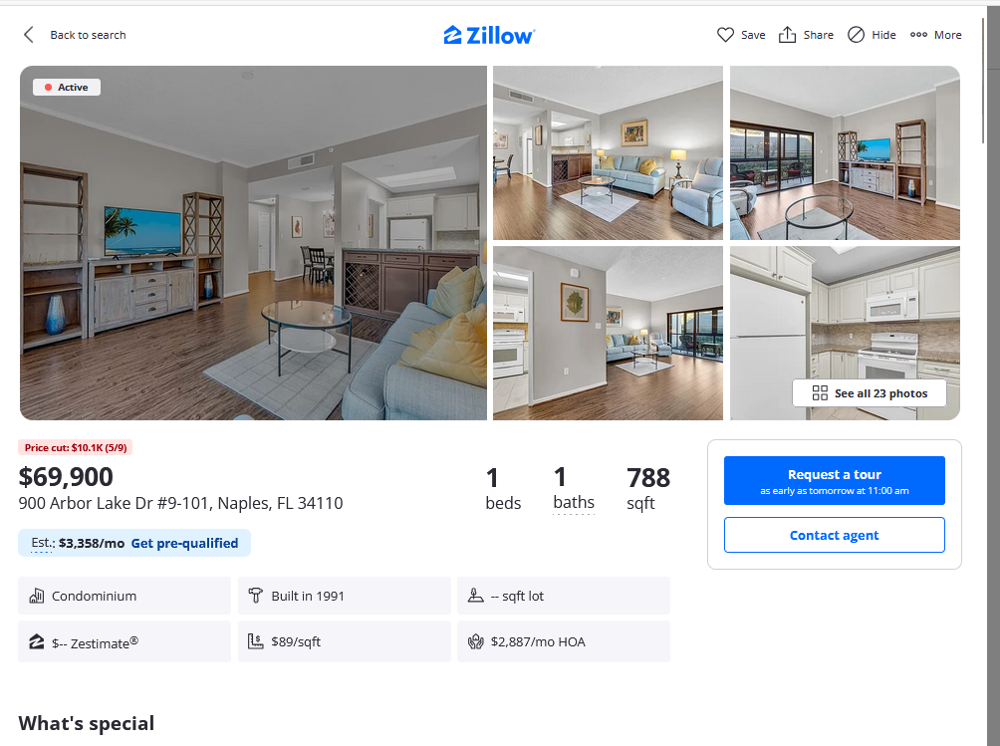

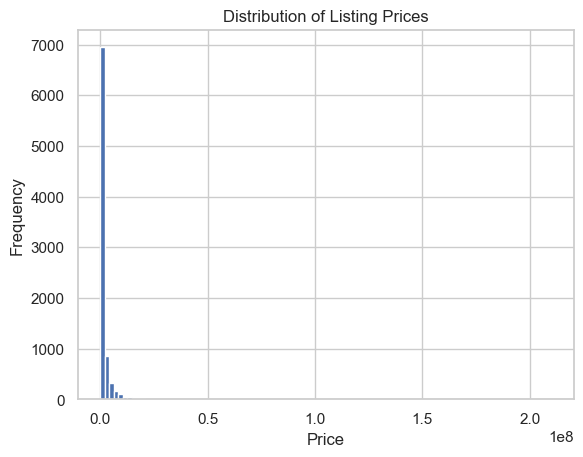

In [17]:
plt.figure()
plt.hist(df['price'], bins=100)
plt.title('Distribution of Listing Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()


In [18]:
# More cleaning / if there are zero beds/baths it's most likely a plot of land or insufficient info which is not great to have since 
# populating the missing bathrooms and bedrooms is taxing

# 1) Clean numeric columns (if not already cleaned)
df['beds']  = pd.to_numeric(df['beds'],  errors='coerce')
df['baths'] = pd.to_numeric(df['baths'], errors='coerce')

# 2) Drop rows where either beds or baths is missing
df = df.dropna(subset=['beds', 'baths'])

# 3) (Optional) Also drop listings with zero beds or zero baths
df = df[(df['beds'] > 0) & (df['baths'] > 0)]

# Now df only contains homes with valid bed & bath counts
print(f"Remaining listings: {len(df)}")
print(df[['beds', 'baths']].describe())

Remaining listings: 4791
              beds        baths
count  4791.000000  4791.000000
mean      2.973492     2.329159
std       0.880031     0.758242
min       1.000000     1.000000
25%       2.000000     2.000000
50%       3.000000     2.000000
75%       3.000000     3.000000
max       5.000000     7.000000


In [19]:
# Helper to format numbers as currency
def fmt_currency(x):
    try:
        v = float(x)
    except:
        return "N/A"
    if v < 0:
        return f"(${abs(v):,.2f})"
    return f"${v:,.2f}"

# 1) Load and clean price
df = pd.read_csv("SWFL_Merged_With_Coords.csv")   # or "Final_SWFL_Cleaning.csv"
df['price'] = (
    df['price'].astype(str)
       .str.replace(r"[\$,]", "", regex=True)
       .astype(float)
)

# 2) Drop homes without valid beds/baths
df['beds']  = pd.to_numeric(df['beds'],  errors='coerce')
df['baths'] = pd.to_numeric(df['baths'], errors='coerce')
df = df.dropna(subset=["beds", "baths"])
df = df[(df['beds'] > 0) & (df['baths'] > 0)]

# 3) Extract cleaned prices
prices = df['price'].dropna()

# 4) Overall summary
summary = prices.describe()
Q1, Q3 = prices.quantile([0.25, 0.75])
IQR = Q3 - Q1

# 5) Outlier bounds (lower floored at 0)
lower = max(0, Q1 - 1.5 * IQR)
upper = Q3 + 1.5 * IQR

# 6) Print results
print("=== Price Summary After Cleaning Beds/Baths ===")
print(f"Count        : {int(summary['count'])}")
print(f"Mean         : {fmt_currency(summary['mean'])}")
print(f"Std Dev      : {fmt_currency(summary['std'])}")
print(f"Min          : {fmt_currency(summary['min'])}")
print(f"25% (Q1)     : {fmt_currency(Q1)}")
print(f"50% (Median) : {fmt_currency(summary['50%'])}")
print(f"75% (Q3)     : {fmt_currency(Q3)}")
print(f"Max          : {fmt_currency(summary['max'])}\n")

print("=== IQR & Outlier Bounds ===")
print(f"IQR            : {fmt_currency(IQR)}")
print(f"Lower bound    : {fmt_currency(lower)}  # floored at $0.00")
print(f"Upper bound    : {fmt_currency(upper)}")





=== Price Summary After Cleaning Beds/Baths ===
Count        : 4791
Mean         : $1,140,798.99
Std Dev      : $1,736,354.27
Min          : $79,999.00
25% (Q1)     : $469,000.00
50% (Median) : $673,000.00
75% (Q3)     : $1,099,000.00
Max          : $44,950,000.00

=== IQR & Outlier Bounds ===
IQR            : $630,000.00
Lower bound    : $0.00  # floored at $0.00
Upper bound    : $2,044,000.00


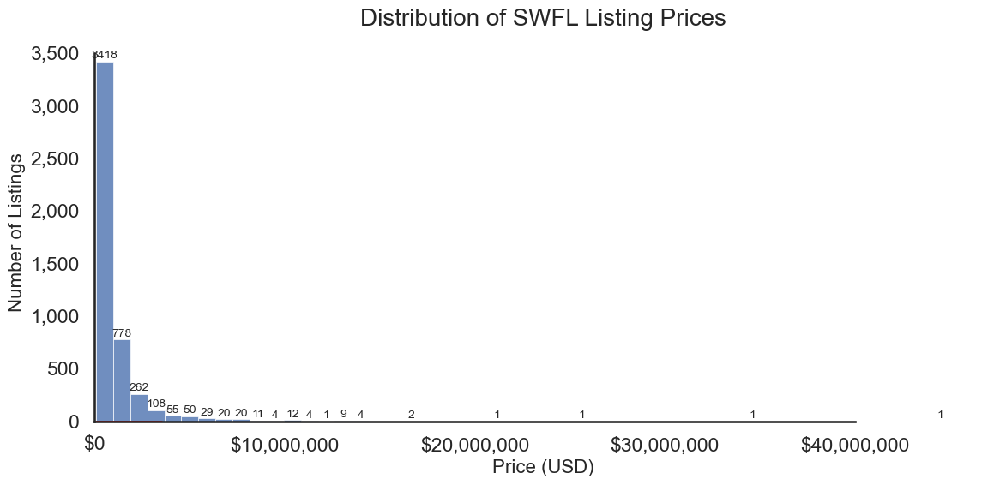

In [20]:
# 3) Font & style
plt.rc('font', family='Times New Roman')
sns.set_style('white')
sns.set_context('talk')

# 4) Figure
fig, ax = plt.subplots(figsize=(12, 6))

# 5) Histogram
counts, bins, patches = ax.hist(
    df['price'],
    bins=50,
    color='#4C72B0',
    edgecolor='white',
    linewidth=0.6,
    alpha=0.8
)

# 6) KDE overlay
sns.kdeplot(
    df['price'],
    ax=ax,
    color='red',
    linewidth=2,
    clip=(0, df['price'].quantile(0.95)),
    cut=0
)

# 7) Annotate counts atop each bar
for count, patch in zip(counts, patches):
    if count > 0:
        ax.text(
            patch.get_x() + patch.get_width()/2,
            count + 5,               # offset a few units above bar
            f'{int(count)}',
            ha='center',
            va='bottom',
            fontsize=10
        )

# 8) Axes formatting
ax.set_xlim(left=0)
ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('${x:,.0f}'))
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

# 9) Clean up and labels
ax.grid(False)
sns.despine(trim=True)
ax.set_title('Distribution of SWFL Listing Prices', fontsize=20, pad=15)
ax.set_xlabel('Price (USD)', fontsize=16)
ax.set_ylabel('Number of Listings', fontsize=16)

plt.tight_layout()
plt.show()

In [21]:
# 3) Sort the DataFrame by price, ascending (least to highest)
df_sorted = df.sort_values(by='price', ascending=False).reset_index(drop=True)

In [22]:
df

,id,price,address,beds,baths,sqft,year_built,link,description,agent_info,...,Interior Features,Rear Exposure,Taxes,Tax Year,Total Floors,Zip Code,original_address,clean_address,latitude,longitude
7,3588,44950000.0,"860 Admiralty Parade E, Naples, FL 34102",5.0,5.0,11559.0,2024.0,https://www.realtyofnaples.com/mls224093367.html,This is an incredible opportunity to own a mas...,"Alena Vydra, PA",...,"Built-In Cabinets, Cathedral Ceiling(s), Close...",S,"$103,971",2023.0,2.0,34102,"860 Admiralty Parade E, Naples, FL 34102","860 Admiralty Parade East, Naples, FL 34102",26.099708,-81.791817
12,3339,34900000.0,"7409 Bay Colony Dr, Naples, FL 34108",5.0,5.0,7210.0,2023.0,https://www.realtyofnaples.com/mls224074688.html,Introducing a meticulously crafted masterpiece...,Oleg Mikhailov,...,"Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",W,"$143,800",2024.0,4.0,34108,"7409 Bay Colony Dr, Naples, FL 34108","7409 Bay Colony Dr, Naples, FL 34108",26.248299,-81.820810
29,3086,25900000.0,"1270 Gulf Shore Blvd S, Naples, FL 34102",5.0,5.0,5789.0,2013.0,https://www.realtyofnaples.com/mls224048342.html,"Unrivaled to any current open market offering,...",Helen Mikhailova,...,"Bar, Built-In Cabinets, Closet Cabinets, Coffe...",W,"$163,186",2023.0,3.0,34102,"1270 Gulf Shore Blvd S, Naples, FL 34102","1270 Gulf Shore Blvd South, Naples, FL 34102",26.131071,-81.804697
39,51,20995000.0,"1910 4th St S, Naples, FL 34102",5.0,6.0,6497.0,2024.0,https://www.realtyofnaples.com/mls225012321.html,Special and rare. This is a once in a lifetime...,Oleg Mikhailov,...,"Built-In Cabinets, Coffered Ceiling(s), Custom...",W,"$33,221",2022.0,2.0,34102,"1910 4th St S, Naples, FL 34102","1910 4th St South, Naples, FL 34102",26.124812,-81.799788
71,59,16950000.0,"508 16th Ave S, Naples, FL 34102",5.0,5.0,5593.0,2025.0,https://www.realtyofnaples.com/mls223012032.html,With preferred southern exposure and comfortab...,"Alena Vydra, PA",...,"Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",S,"$9,846",2020.0,2.0,34102,"508 16th Ave S, Naples, FL 34102","508 16th Ave South, Naples, FL 34102",26.127841,-81.798594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8566,120,120000.0,"900 Arbor Lake Dr # 207, Naples, FL 34110",1.0,1.0,788.0,1991.0,https://www.realtyofnaples.com/mls224069863.html,MOTIVATED SELLER! SELLER WANTS OFFERS!! Are yo...,Helen Mikhailova,...,"Fire Sprinkler, Smoke Detectors, Window Coverings",N,$223,2023.0,1.0,34110,"900 Arbor Lake Dr # 207, Naples, FL 34110","900 Arbor Lake Dr # 207, Naples, FL 34110",26.302178,-81.818898
8567,121,119000.0,"900 Arbor Lake Dr # 202, Naples, FL 34110",1.0,1.0,1004.0,1991.0,https://www.realtyofnaples.com/mls224101656.html,"**SELLER SAYS ""BRING ALL OFFERS"" ** LAKE VIEW*...",Helen Mikhailova,...,"Built-In Cabinets, Closet Cabinets, Fire Sprin...",S,$731,2023.0,5.0,34110,"900 Arbor Lake Dr # 202, Naples, FL 34110","900 Arbor Lake Dr # 202, Naples, FL 34110",26.302178,-81.818898
8568,1801,90000.0,"228 Cattleya Refuge # 228, Naples, FL 34114",2.0,1.0,960.0,1988.0,https://www.realtyofnaples.com/mls225018999.html,Mobile home on its own land Located in the Nap...,Oleg Mikhailov,...,Other,E,"$1,171",2024.0,1.0,34114,"228 Cattleya Refuge # 228, Naples, FL 34114","228 Cattleya Refuge # 228, Naples, FL 34114",26.041685,-81.670079
8569,122,79999.0,"900 Arbor Lake Dr # 101, Naples, FL 34110",1.0,1.0,788.0,1991.0,https://www.realtyofnaples.com/mls224096044.html,***Best Deal In Town!*** Bring Your Offer! **C...,Helen Mikhailova,...,"Built-In Cabinets, Smoke Detectors",SW,$528,2023.0,1.0,34110,"900 Arbor Lake Dr # 101, Naples, FL 34110","900 Arbor Lake Dr # 101, Naples, FL 34110",26.302178,-81.818898


# Dropping Unnecessary Terms

Here, I am dropping any listings that have duplicates, are classified as "Hotel" or "Condos". In addition some address are apartments so I went to address and dropped any values that have "APT" which typically is apartment or "#" since this can refer to a room number. I also dropped any rooms with one since this is supposed to help families and under an assumption that 1 bedroom is an apartment/condo/hotel. 

In [24]:
# Drop listings with duplicate addresses in one line:
df = df.drop_duplicates(subset=['address'], keep='first').reset_index(drop=True)

In [25]:
# Drop any listings whose “Community Type” contains “Hotel” (case-insensitive) and report how many were removed
mask_hotel = df['Community Type'].str.contains('Hotel', case=False, na=False)
print(f"Dropped {mask_hotel.sum()} listings in Hotel communities; {len(df) - mask_hotel.sum()} remain.")
df = df[~mask_hotel].reset_index(drop=True)


Dropped 283 listings in Hotel communities; 4445 remain.


In [26]:
df

,id,price,address,beds,baths,sqft,year_built,link,description,agent_info,...,Interior Features,Rear Exposure,Taxes,Tax Year,Total Floors,Zip Code,original_address,clean_address,latitude,longitude
0,3588,44950000.0,"860 Admiralty Parade E, Naples, FL 34102",5.0,5.0,11559.0,2024.0,https://www.realtyofnaples.com/mls224093367.html,This is an incredible opportunity to own a mas...,"Alena Vydra, PA",...,"Built-In Cabinets, Cathedral Ceiling(s), Close...",S,"$103,971",2023.0,2.0,34102,"860 Admiralty Parade E, Naples, FL 34102","860 Admiralty Parade East, Naples, FL 34102",26.099708,-81.791817
1,3339,34900000.0,"7409 Bay Colony Dr, Naples, FL 34108",5.0,5.0,7210.0,2023.0,https://www.realtyofnaples.com/mls224074688.html,Introducing a meticulously crafted masterpiece...,Oleg Mikhailov,...,"Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",W,"$143,800",2024.0,4.0,34108,"7409 Bay Colony Dr, Naples, FL 34108","7409 Bay Colony Dr, Naples, FL 34108",26.248299,-81.820810
2,3086,25900000.0,"1270 Gulf Shore Blvd S, Naples, FL 34102",5.0,5.0,5789.0,2013.0,https://www.realtyofnaples.com/mls224048342.html,"Unrivaled to any current open market offering,...",Helen Mikhailova,...,"Bar, Built-In Cabinets, Closet Cabinets, Coffe...",W,"$163,186",2023.0,3.0,34102,"1270 Gulf Shore Blvd S, Naples, FL 34102","1270 Gulf Shore Blvd South, Naples, FL 34102",26.131071,-81.804697
3,51,20995000.0,"1910 4th St S, Naples, FL 34102",5.0,6.0,6497.0,2024.0,https://www.realtyofnaples.com/mls225012321.html,Special and rare. This is a once in a lifetime...,Oleg Mikhailov,...,"Built-In Cabinets, Coffered Ceiling(s), Custom...",W,"$33,221",2022.0,2.0,34102,"1910 4th St S, Naples, FL 34102","1910 4th St South, Naples, FL 34102",26.124812,-81.799788
4,59,16950000.0,"508 16th Ave S, Naples, FL 34102",5.0,5.0,5593.0,2025.0,https://www.realtyofnaples.com/mls223012032.html,With preferred southern exposure and comfortab...,"Alena Vydra, PA",...,"Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",S,"$9,846",2020.0,2.0,34102,"508 16th Ave S, Naples, FL 34102","508 16th Ave South, Naples, FL 34102",26.127841,-81.798594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4440,3539,173500.0,"3325 Airport Rd N # D3, Naples, FL 34105",2.0,1.0,778.0,1973.0,https://www.realtyofnaples.com/mls224067170.html,"Seller is very motivated!!! This lovely 2 bed,...",Helen Mikhailova,...,NaN,W,$933,2023.0,1.0,34105,"3325 Airport Rd N # D3, Naples, FL 34105","3325 Airport Rd North # D3, Naples, FL 34105",NaN,NaN
4441,3546,169000.0,"3325 Airport Rd N # Q5, Naples, FL 34105",2.0,1.0,778.0,1973.0,https://www.realtyofnaples.com/mls224101633.html,**Attention Investors or Homebuyers!** This 2B...,Oleg Mikhailov,...,NaN,E,"$1,491",2023.0,1.0,34105,"3325 Airport Rd N # Q5, Naples, FL 34105","3325 Airport Rd North # Q5, Naples, FL 34105",NaN,NaN
4442,3540,160000.0,"3325 Airport Rd N # C4, Naples, FL 34105",1.0,1.0,594.0,1973.0,https://www.realtyofnaples.com/mls224090245.html,Poinciana Condo is centrally located in the he...,Helen Mikhailova,...,"Built-In Cabinets, Smoke Detectors, Walk-In Cl...",W,"$1,330",2023.0,1.0,34105,"3325 Airport Rd N # C4, Naples, FL 34105","3325 Airport Rd North # C4, Naples, FL 34105",NaN,NaN
4443,3541,159000.0,"3325 Airport Rd N # E4, Naples, FL 34105",1.0,1.0,590.0,1975.0,https://www.realtyofnaples.com/mls224104095.html,**Charming First-Floor Corner Condo in Prime N...,Helen Mikhailova,...,"Built-In Cabinets, Disability Equipped",E,"$1,234",2024.0,2.0,34105,"3325 Airport Rd N # E4, Naples, FL 34105","3325 Airport Rd North # E4, Naples, FL 34105",NaN,NaN


In [27]:
# 1) Record starting count
initial_count = len(df)

# 2) Identify 1-bedroom listings
mask_1br = df['beds'] == 1

# 3) Drop them and reset index
df = df[~mask_1br].reset_index(drop=True)

# 4) Report how many were removed
removed = mask_1br.sum()
print(f"Dropped {removed} 1-bedroom listings; {len(df)} remain (from {initial_count}).")


Dropped 134 1-bedroom listings; 4311 remain (from 4445).


In [28]:
# 1) Record starting count
initial_count = len(df)

# 2) Identify addresses containing “APT” (case‐insensitive)
mask_apt = df['address'].str.contains(r'\bAPT\b', case=False, na=False)

# 3) Drop those rows and reset index
df = df[~mask_apt].reset_index(drop=True)

# 4) Report how many were removed
removed = mask_apt.sum()
print(f"Dropped {removed} listings with 'APT' in the address; {len(df)} remain (from {initial_count}).")


Dropped 1 listings with 'APT' in the address; 4310 remain (from 4311).


In [29]:
df

,id,price,address,beds,baths,sqft,year_built,link,description,agent_info,...,Interior Features,Rear Exposure,Taxes,Tax Year,Total Floors,Zip Code,original_address,clean_address,latitude,longitude
0,3588,44950000.0,"860 Admiralty Parade E, Naples, FL 34102",5.0,5.0,11559.0,2024.0,https://www.realtyofnaples.com/mls224093367.html,This is an incredible opportunity to own a mas...,"Alena Vydra, PA",...,"Built-In Cabinets, Cathedral Ceiling(s), Close...",S,"$103,971",2023.0,2.0,34102,"860 Admiralty Parade E, Naples, FL 34102","860 Admiralty Parade East, Naples, FL 34102",26.099708,-81.791817
1,3339,34900000.0,"7409 Bay Colony Dr, Naples, FL 34108",5.0,5.0,7210.0,2023.0,https://www.realtyofnaples.com/mls224074688.html,Introducing a meticulously crafted masterpiece...,Oleg Mikhailov,...,"Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",W,"$143,800",2024.0,4.0,34108,"7409 Bay Colony Dr, Naples, FL 34108","7409 Bay Colony Dr, Naples, FL 34108",26.248299,-81.820810
2,3086,25900000.0,"1270 Gulf Shore Blvd S, Naples, FL 34102",5.0,5.0,5789.0,2013.0,https://www.realtyofnaples.com/mls224048342.html,"Unrivaled to any current open market offering,...",Helen Mikhailova,...,"Bar, Built-In Cabinets, Closet Cabinets, Coffe...",W,"$163,186",2023.0,3.0,34102,"1270 Gulf Shore Blvd S, Naples, FL 34102","1270 Gulf Shore Blvd South, Naples, FL 34102",26.131071,-81.804697
3,51,20995000.0,"1910 4th St S, Naples, FL 34102",5.0,6.0,6497.0,2024.0,https://www.realtyofnaples.com/mls225012321.html,Special and rare. This is a once in a lifetime...,Oleg Mikhailov,...,"Built-In Cabinets, Coffered Ceiling(s), Custom...",W,"$33,221",2022.0,2.0,34102,"1910 4th St S, Naples, FL 34102","1910 4th St South, Naples, FL 34102",26.124812,-81.799788
4,59,16950000.0,"508 16th Ave S, Naples, FL 34102",5.0,5.0,5593.0,2025.0,https://www.realtyofnaples.com/mls223012032.html,With preferred southern exposure and comfortab...,"Alena Vydra, PA",...,"Bar, Built-In Cabinets, Cathedral Ceiling(s), ...",S,"$9,846",2020.0,2.0,34102,"508 16th Ave S, Naples, FL 34102","508 16th Ave South, Naples, FL 34102",26.127841,-81.798594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4305,1253,189900.0,"256 Palm Dr # 6, Naples, FL 34112",2.0,2.0,1010.0,1974.0,https://www.realtyofnaples.com/mls225006150.html,Live the Ultimate Golf & Resort Lifestyle at G...,Helen Mikhailova,...,Other,W,"$1,300",2023.0,1.0,34112,"256 Palm Dr # 6, Naples, FL 34112","256 Palm Dr # 6, Naples, FL 34112",26.129556,-81.760567
4306,3537,180000.0,"3325 Airport Rd N # J8, Naples, FL 34105",2.0,1.0,790.0,1973.0,https://www.realtyofnaples.com/mls225014041.html,The perfect blend of comfort and convenience a...,Oleg Mikhailov,...,"Pantry, Window Coverings",E,"$1,325",2024.0,1.0,34105,"3325 Airport Rd N # J8, Naples, FL 34105","3325 Airport Rd North # J8, Naples, FL 34105",NaN,NaN
4307,3538,175000.0,"3325 Airport Rd N # F3, Naples, FL 34105",2.0,1.0,778.0,1973.0,https://www.realtyofnaples.com/mls225019638.html,Discover this charming fully furnished 2-bedro...,Oleg Mikhailov,...,"Built-In Cabinets, Pantry, Smoke Detectors, Wi...",W,"$1,558",2024.0,1.0,34105,"3325 Airport Rd N # F3, Naples, FL 34105","3325 Airport Rd North # F3, Naples, FL 34105",NaN,NaN
4308,3539,173500.0,"3325 Airport Rd N # D3, Naples, FL 34105",2.0,1.0,778.0,1973.0,https://www.realtyofnaples.com/mls224067170.html,"Seller is very motivated!!! This lovely 2 bed,...",Helen Mikhailova,...,NaN,W,$933,2023.0,1.0,34105,"3325 Airport Rd N # D3, Naples, FL 34105","3325 Airport Rd North # D3, Naples, FL 34105",NaN,NaN


In [30]:
# 1) Record starting count
initial_count = len(df)

# 2) Identify listings to drop:
#    – “Condo” in the description (case‐insensitive)
#    – Any “#” in the address (unit numbers)
mask_drop = (
    df['description'].str.contains('condo', case=False, na=False) |
    df['address'].str.contains(r'#', na=False)
)

# 3) Drop them and reset the index
df = df[~mask_drop].reset_index(drop=True)

# 4) Report how many were removed
removed = mask_drop.sum()
print(f"Dropped {removed} listings with “Condo” in description or ‘#’ in address; {len(df)} remain (from {initial_count}).")

# Reset the ID / primary column
df['id'] = range(1, len(df) + 1)

# 5) Save the cleaned DataFrame 
df.to_csv('SWFL_Data_Cleaned_2.csv', index=False)
print("Saved cleaned data to SWFL_Data_Cleaned_2.csv")


Dropped 1271 listings with “Condo” in description or ‘#’ in address; 3039 remain (from 4310).
Saved cleaned data to SWFL_Data_Cleaned_2.csv


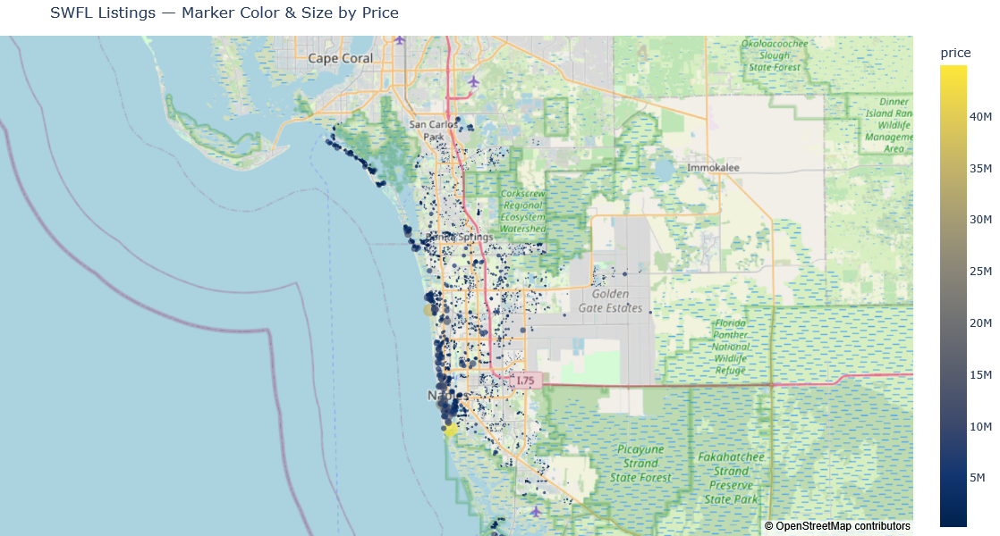

In [64]:


# 1) Load & clean
df = pd.read_csv('SWFL_Data_Cleaned_2.csv')\
       .rename(columns={'Zip Code':'Zip_Code'})
df['latitude']  = pd.to_numeric(df['latitude'],  errors='coerce')
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['price']     = pd.to_numeric(df['price'].astype(str)
                                   .str.replace(r'[\$,]', '', regex=True),
                                errors='coerce')
df = df.dropna(subset=['latitude','longitude','price'])

# 2) Map, colored & sized by price
fig = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    color="price",          # color‐scale now reflects price
    size="price",           # marker size reflects price too
    hover_name="address",
    hover_data=["Zip_Code","price"],
    color_continuous_scale="Cividis",
    size_max=12,
    zoom=9,
    height=600,
    title="SWFL Listings — Marker Color & Size by Price"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin=dict(r=0, t=40, l=0, b=0)
)
fig.show()


There is a high chance that points that are near the beach are apartments so we will continue to tackle this

In [68]:


# 1) Load & clean
df = pd.read_csv('SWFL_Data_Cleaned_2.csv')\
       .rename(columns={'Zip Code':'Zip_Code'})
df['latitude']  = pd.to_numeric(df['latitude'], errors='coerce')
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['price']     = pd.to_numeric(
    df['price'].astype(str).str.replace(r'[\$,]', '', regex=True),
    errors='coerce'
)
df = df.dropna(subset=['latitude','longitude','price'])

# 2) Create Folium map centered on the mean coords
m = folium.Map(
    location=[df['latitude'].mean(), df['longitude'].mean()],
    zoom_start=10,
    tiles='OpenStreetMap'   # reliable free tiles
)

# 3) Add a color scale for price
vmin, vmax = df['price'].min(), df['price'].max()
colormap = cm.LinearColormap(
    ['green','yellow','red'], 
    vmin=vmin, vmax=vmax,
    caption='Listing Price (USD)'
)
colormap.add_to(m)

# 4) Clustered markers
marker_cluster = MarkerCluster().add_to(m)
for _, row in df.iterrows():
    color = colormap(row['price'])
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(
            f"<b>{row['address']}</b><br>"
            f"Price: ${row['price']:,.0f}<br>"
            f"Zip: {int(row['Zip_Code'])}"
        )
    ).add_to(marker_cluster)

# 5) Display inline
display(m)


# Categorical Variables (One Hot Encoding and Dummy Variables)
Here we separated important features which is important for modeling which increased our file size

In [78]:

# load
df = pd.read_csv('SWFL_Data_Cleaned_2.csv')

# 1) address cleanup
if 'clean_address' in df.columns:
    df['address'] = df['clean_address']
df.drop(columns=['original_address','clean_address'], errors='ignore', inplace=True)

# 2) drop living area
df.drop(columns=['Living_Area','Living Area'], errors='ignore', inplace=True)

# 3) OHE for those categorical cols
ohe_cols = [c for c in ['Floor Description','Rear Exposure','Community Name','Zip Code'] 
            if c in df.columns]
df = pd.get_dummies(df, columns=ohe_cols,
                    prefix=[c.replace(' ','_') for c in ohe_cols],
                    drop_first=False)

# 4) Amenities flags
if 'Amenities' in df.columns:
    keywords = ['beach','fitness','clubhouse','golf','pickle','restaurant']
    for kw in keywords:
        df[f'amenity_{kw}'] = (df['Amenities']
                               .str.contains(kw, case=False, na=False)
                               .astype(int))
    df.drop(columns=['Amenities'], inplace=True)

# 5) Interior Features → one-hot
# find any column whose name contains “interior”
int_cols = [c for c in df.columns if 'interior' in c.lower()]
if int_cols:
    int_col = int_cols[0]
    # your full master list of possible features
    features = [
        'Built-In Cabinets', 'Bar', 'Cathedral Ceiling(s)', 'Coffered Ceiling(s)',
        'Custom Mirrors', 'Fireplace', 'Foyer', 'French Doors', 'Laundry Tub',
        'Pantry', 'Smoke Detectors', 'Wired for Sound', 'Tray Ceiling(s)',
        'Vaulted Ceiling(s)', 'Volume Ceiling', 'Walk-In Closet(s)', 'Wet Bar',
        'Window Coverings', 'Fire Sprinkler', 'Disability Equipped',
        'Multi Phone Lines', 'Pull Down Stairs', 'Zero/Corner Door Sliders',
        'Exclusions', 'Other', 'Wheel Chair Access'
    ]

    # prepare the list-of-lists
    df[int_col] = df[int_col].fillna('')
    exploded = (df[int_col]
                .str.split(',')
                .apply(lambda items: [item.strip() 
                                      for item in items 
                                      if item.strip()]))
    
    # multi-label binarizer (forces exactly our master “features” list)
    mlb = MultiLabelBinarizer(classes=features)
    int_dums = pd.DataFrame(mlb.fit_transform(exploded),
                            columns=mlb.classes_,
                            index=df.index)
    
    # rename to interior_*
    int_dums.columns = [
        'interior_' +
        col.lower()
           .replace(' ', '_')
           .replace('(', '')
           .replace(')', '')
           .replace('-', '_')
           .replace('/', '_')
        for col in int_dums.columns
    ]

    # concat back & drop original
    df = pd.concat([df, int_dums], axis=1)
    df.drop(columns=[int_col], inplace=True)

# 6) write out
df.to_csv('SWFL_Data_Cleaned_Final_Version.csv', index=False)
print("Saved one-hot encoded dataset to SWFL_Data_Cleaned_Final_Version.csv")


C:\Users\chris\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:900: UserWarning:

unknown class(es) ['Closet Cabinets'] will be ignored



Saved one-hot encoded dataset to SWFL_Data_Cleaned_Final_Version.csv
